# Descripcion del hardware

Procesador: Intel(R) Core(TM) i5 8300H CPU @ 2.3GHz 2.3GHz

Ram: 20 Gb

Optane: 20 Gb

Vram: 4Gb

Tarjeta de video: Nvidia  GeForce GTX 1050 @ compute capability: 6.1

In [1]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

# Importacion de librerias:
Las librerias cargadas son:
* *matplotlib* para ver las imaganes
* *tensorflow* para leer imagenes y exportarlas, utilizacion de tensores etc.
* *numpy* para manejar arreglos
* *cv2* Para plica el efecto de *desenfoque*. Cooresponde a la libreria de Open CV (Computer Vision), [Tutoriales de OpenCV in Python](https://docs.opencv.org/master/d6/d00/tutorial_py_root.html)
* *os* para listar los ficheros en de una ruta y permite ejecutar comandos MS-DOS

In [68]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2
import os 
from IPython.display import Image

print(tf.__version__)
tf.test.is_gpu_available(cuda_only=True, min_cuda_compute_capability=None)

2.0.0


True

#### Utilizaremos TensorFlow 2.0 y adicionalmente verificaremos si la GPU esta siendo reconocida correctamente.

In [69]:
from tensorflow.python.client import device_lib
tf.test.is_built_with_cuda()
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 1091766204596832756,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 3147261543
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 3965506548260883103
 physical_device_desc: "device: 0, name: GeForce GTX 1050, pci bus id: 0000:01:00.0, compute capability: 6.1"]

![Cuda Toolkit](https://i.ytimg.com/vi/pB6h_hFpRGo/maxresdefault.jpg)

#### Definimos los Directorios de donde cargaremos las imagenes y hacia el cual exportaremos las imagenes desenfocadas.
Listamos los elementos de la ruta impath

In [70]:
# Ruta raiz
#PATH = '/content/drive/My Drive/UNIVERSIDAD NACIONAL ARCHIVOS/2020 I/Mineria de Datos/Proyecto/Dataset final'
PATH = 'C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto'
# Ruta de datos de entrada 
INPATH = PATH + '/inputFlowers_Desenfoque2'
# Ruta de datos de salida
OUPATH = PATH + '/outputFlowers'
# Ruta para los checkpoints
CKPATH = PATH + '/checkpoints'

imgurls = os.listdir(INPATH)

#### Realizamos una lectura previa de las imagenes, las cuales son mezcladas para poder ver como se comportara el efecto en una muestra aleatoria de tamaño 500 e imprimimos los tamanos y el resultado para validar

In [71]:
n = 625#8189
train_n = round(n*0.8)

randurls = np.copy(imgurls)
np.random.seed(23)
np.random.shuffle(randurls)

tr_urls = randurls[:train_n]
ts_urls = randurls[train_n:n]

print(np.array(randurls).shape)
print(np.array(tr_urls).shape)
print(len(imgurls),len(tr_urls),len(ts_urls))


(8189,)
(500,)
8189 500 125


#### Definimos nuestra funcion de rescalado de imaganes para manejar el mismo numero de pixeles en ancho y alto en todas las imagenes dado que estas vienen de diferentes tamaños y tambien la funcion que nos va a permitir hacer el cargue apropidamente.

Nosotros estamos trabajando las imagenes como un tensor de 256X256X3 cuyas entradas son de tipo Float32, y solamente tomamos los primeros 3 canales de color y adicionalmente estamos normalizando las imagenes dividiendo por 255, (255 en los tres canales representa Blanco y 0 representa Negro). En este enlace es posible entender mejor la composicionde colores de una imagen. [RGB](https://www.mclibre.org/consultar/htmlcss/css/css-color.html#:~:text=Los%20c%C3%B3digos%20RGB%20se%20pueden,desde%200%25%20hasta%20100%25.)

### Funciones definidas:
* Resize: Ajustar numero de pixeles
* Normalize: Lleva los valores dentro de la escala 0-255  a la escala -1-1 
* Random_jitter: Realiza Flips Horizontales de las imagenes para aplicar el "data aumentation"
* load_image: Funcion de cargue de imagenes tomando los primeros 3 canales y aplicando el random jitter

In [72]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
#rescalado de imagenes
def resize(inimg,tgimg,height,weidth):
    inimg = tf.image.resize(inimg,[height,weidth])
    tgimg = tf.image.resize(tgimg,[height,weidth])    
    return inimg , tgimg 

def normalize(inimg,tgimg):
    inimg = (inimg/127.5) - 1
    tgimg = (tgimg/127.5) - 1 
    return inimg,tgimg

@tf.function()
def random_jitter(inimg,tgimg):
    inimg,tgimg = resize(inimg,tgimg,286,286)
    
    stacked_image = tf.stack([inimg,tgimg] , axis=0)
    cropped_image = tf.image.random_crop(stacked_image,size = [2,IMG_WIDTH, IMG_HEIGHT , 3]) 
    inimg , tgimg = cropped_image[0], cropped_image[1]
    
    if tf.random.uniform(()) > 0.5:
        inimg = tf.image.flip_left_right(inimg)
        tgimg = tf.image.flip_left_right(tgimg)
        print()
    return inimg,tgimg
        
def load_image(filename,augment = True):
    inimg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(INPATH + '/' + filename)),tf.float32)[...,:3]#limitando solo a 4 componentes de 3 colores RGB
    tgimg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(OUPATH + '/' + filename)),tf.float32)[...,:3]#
    
    inimg , tgimg  = resize(inimg , tgimg , IMG_HEIGHT,IMG_WIDTH)
    
    if augment:
        inimg , tgimg = random_jitter(inimg , tgimg)
        
    inimg , tgimg = normalize(inimg , tgimg)
    return inimg , tgimg

def load_train_image(filename):
    return load_image(filename,augment = True)

def load_test_image(filename):
    return load_image(filename,augment = False)


![Crop](https://www.drupal.org/files/project-images/Manual-Crop.jpg)

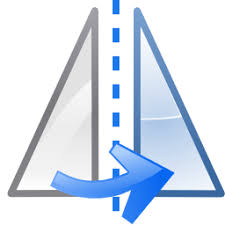

### Probamos nuestra funcion de cargue (trae el input y el target)

image_07739.jpg

0.0 0.94509804


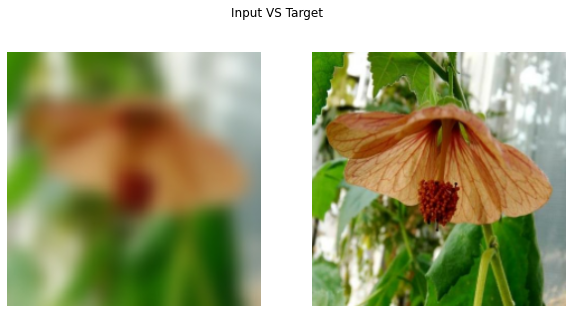

In [73]:
print(randurls[0])
train_img_input = (load_train_image(randurls[0])[0] + 1) /2
train_img_targe = (load_train_image(randurls[0])[1] + 1) /2

print(np.min(train_img_input.numpy()),np.max(train_img_input.numpy()))
with tf.device('/device:GPU:0'):
    fig , ax  = plt.subplots(1,2,figsize=(10,5)) 
    
    ax[0].imshow(train_img_input)
    ax[1].imshow(train_img_targe)
    ax[0].axis('off')
    ax[1].axis('off')
    plt.suptitle('Input VS Target')
    plt.show()

# Definimos el canal de nuestros datos de entrenamiento y test 

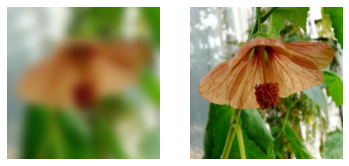

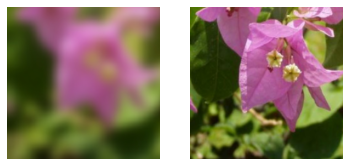

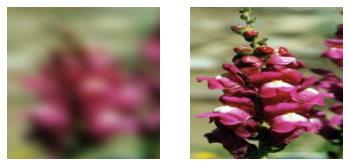

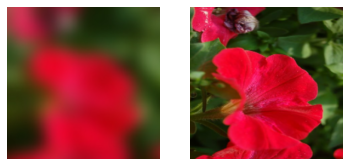

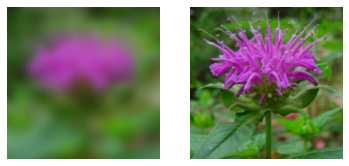

In [74]:
train_dataset = tf.data.Dataset.from_tensor_slices(tr_urls)
train_dataset = train_dataset.map(load_train_image , num_parallel_calls = tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.batch(1)

test_dataset = tf.data.Dataset.from_tensor_slices(ts_urls)
test_dataset = test_dataset.map(load_test_image , num_parallel_calls = tf.data.experimental.AUTOTUNE)
test_dataset = test_dataset.batch(1)

for inimg , tgimg  in train_dataset.take(5):
    fig, ax = plt.subplots(1,2)
    ax[0].imshow(((inimg[0,...] )  +1 ) /2 ) 
    ax[1].imshow(((tgimg[0,...] )  +1 ) /2 ) 
    ax[0].axis('off')
    ax[1].axis('off')
    plt.show()
    

# Redes Generativas Adversarias
Detalles: [GAN's](https://www.xataka.com/inteligencia-artificial/conceptos-inteligencia-artificial-que-gans-redes-generativas-antagonicas)

![gans](https://i.blogs.es/bd2b76/gan_arquitectura/1366_2000.jpg)

# Generador
## U-net
![unet](https://miro.medium.com/max/4254/1*l5dwD_BNKu0ltq5M58ZndQ.png)

### Definimos una funcion que permita generar cada bloque del encoder
(3 capas/bloque)

### Convolucion(Filtros)
![convolucion](https://s3-us-west-2.amazonaws.com/static.pyimagesearch.com/keras-conv2d/keras_conv2d_padding.gif)

### BatchNormalization
![BatchNormalization](https://3.bp.blogspot.com/-ogeLSVo_Tek/WNPS4Glmd4I/AAAAAAAAKBo/bfp-KUSsFmQGolE0uNEeWFzDXA8IPU75wCLcB/s1600/Screenshot%2Bfrom%2B2017-03-23%2B21-50-33.png)


### Leaky rectified linear unit  (RELU)
![relu](https://i.stack.imgur.com/Z2Nb5.jpg)

Aplicamos en secuencia:
* Convoluciones para detectar caracteristicas de las flores
* BatchNormalization para dar estabilidad y rapidez a la estimacion 
* ReLU aporta la no-linealidad, apaga neuronas con salidas negativas y resultados de menor error que las funciones de activacion sigmoides 

In [75]:
from tensorflow.keras import *
from tensorflow.keras.layers import * 

def downsample(filters , apply_batchnorm = True ):
    result = Sequential()
    
    initializer = tf.random_normal_initializer(0,0.02)
    
    result.add(Conv2D(filters,
                     kernel_size = 4,
                     strides = 2,
                     padding = "same",
                     kernel_initializer = initializer,
                     use_bias = not apply_batchnorm))
    
    if apply_batchnorm:
        result.add(BatchNormalization())
    
    result.add(LeakyReLU())
    return result
    
downsample(64)

#### El resultado es una imagen cuyo tamaño se ha reducido a la mitad es decir de 256x256 a 128x128 en el primer bloque y de igual modo en lossiguientes bloques.

[Mmas funciones de activacion y sus propiedades](https://medium.com/@himanshuxd/activation-functions-sigmoid-relu-leaky-relu-and-softmax-basics-for-neural-networks-and-deep-8d9c70eed91e)

## Ahora definamos una funion para hacer el upsample en el decoder

## Transposed Convolution

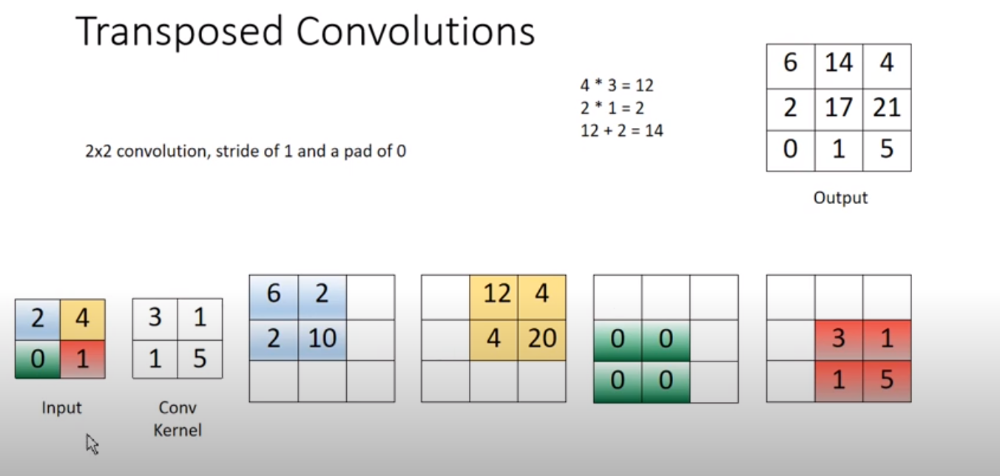

In [76]:
Image(filename = 'C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto/Codigo Noteboocks/Imagenes_Noteboocks_final/convtranspose.PNG')

![Tconvolucion](https://miro.medium.com/max/1972/1*kOThnLR8Fge_AJcHrkR3dg.gif)

## DropOut

![dropout](https://cdn-images-1.medium.com/max/1000/1*zwucz12TmYEaca5OcaPvbA.png)


Aplicamos en secuencia:
* Convoluciones inversas
* BatchNormalization para dar estabilidad y rapidez a la estimacion
* Dropout
* ReLU aporta la no-linealidad, apaga neuronas con salidas negativas y resultados de menor error que las funciones de activacion sigmoides 

In [77]:
def upsample(filters , apply_dropout = False ):
    result = Sequential()
    
    initializer = tf.random_normal_initializer(0,0.02)
    
    result.add(Conv2DTranspose(filters,
                               kernel_size = 4,
                               strides = 2,
                               padding = "same",
                               kernel_initializer = initializer,
                               use_bias = False))
    
   
    result.add(BatchNormalization())
    result.add(Dropout(0.5))
    result.add(ReLU())
    return result
    
upsample(64)

### Unimos los bloques y creamos las Skip conections 

In [78]:
def Generator():
    inputs = tf.keras.layers.Input(shape = [None,None,3])
    
    down_stack= [
        downsample(64,apply_batchnorm = False),             #(bs, 128, 128, 64)
        downsample(128),                                    #(bs, 64, 64, 128)
        downsample(256),                                    #(bs, 32, 32, 256)
        downsample(512),                                    #(bs, 16, 16, 512)
        downsample(512),                                    #(bs, 8, 8, 512)
        downsample(512),                                    #(bs, 4, 4, 512)
        downsample(512),                                    #(bs, 2, 2, 512)
        downsample(512)                                     #(bs, 1, 1, 512)
    ] 
    
    up_stack = [
        upsample(512,apply_dropout=True),                   #(bs, 2, 2, 1024)
        upsample(512,apply_dropout=True),                   #(bs, 4, 4, 1024)
        upsample(512,apply_dropout=True),                   #(bs, 8, 8, 1024)
        upsample(512),                                      #(bs, 16, 16, 1024)
        upsample(256),                                      #(bs, 32, 32, 512)
        upsample(128),                                      #(bs, 64, 64, 256)
        upsample(64)                                        #(bs, 128, 128, 128)
    ]
    
    initializer = tf.random_normal_initializer(0,0.02)
    
    last = Conv2DTranspose(filters = 3,
                        kernel_size = 4,#2 debe ser  4  
                        strides = 2,
                        padding = 'same',
                        kernel_initializer = initializer,
                        activation = 'tanh')
    
   
 # Tomamos los resultados de cada bloque y los almacenamos secuencialmente en s, lo invertimos de modo que el ultimo resultado sea el primero, y cada bloque del decoder esta concatenado  a su correspondiente bloque en el encoder 
    x = inputs
    s = []
    
    concat = Concatenate()
    for down in down_stack:
        x = down(x)
        s.append(x)
        
    s = reversed(s[:-1])
    
    for up , sk  in zip(up_stack,s) :
        x = up(x)
        x = concat([x,sk])
        
    last = last(x)
    
    return Model(inputs = inputs , outputs = last)

### Probaremos el generador (Aun no entrenado)

0.0 1.0


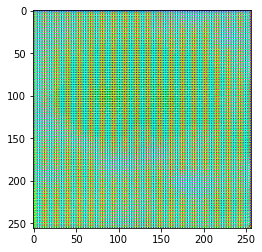

In [79]:
generator = Generator()
gen_output = generator(((inimg+1)*255) , training = False )
gen_output = (gen_output+1)/2
print(np.min(gen_output[0,...]),np.max(gen_output[0,...]))
plt.imshow(gen_output[0,...])

## Graficando la red:

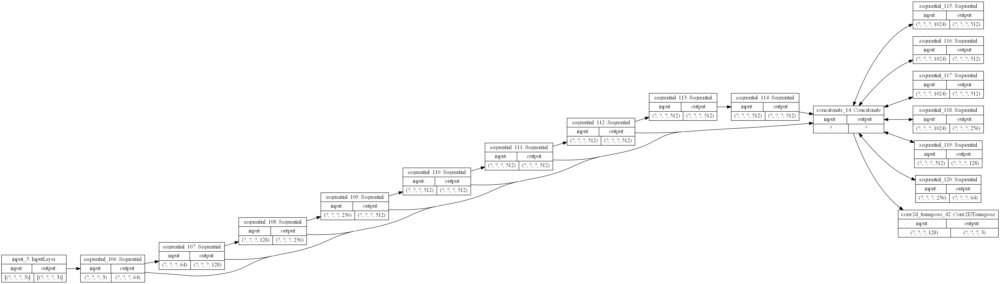

In [80]:
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=128,rankdir='LR')

In [81]:
generator = Generator()
generator.summary()

Model: "model_15"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
sequential_121 (Sequential)     (None, None, None, 6 3136        input_6[0][0]                    
__________________________________________________________________________________________________
sequential_122 (Sequential)     (None, None, None, 1 131584      sequential_121[0][0]             
__________________________________________________________________________________________________
sequential_123 (Sequential)     (None, None, None, 2 525312      sequential_122[0][0]             
___________________________________________________________________________________________

# Definiremos nuestro Discriminador

## PatchGAN

Un patchGAN es una red convolucional que se diferencia en que, en lugar de asignar una imagen de entrada a escalar, se asigna a una matriz NxN. Donde cada elemento individual en la matriz NxN se asigna a un parche en la imagen de entrada. Finalmente, se hace un promedio para encontrar que la imagen de entrada completa es real o falsa.



![patchGan](https://storage.googleapis.com/groundai-web-prod/media/users/user_83463/project_131801/images/x1.png)

In [82]:
def Discriminator():
    
    ini = Input(shape = [None,None,3] , name = 'input_img')
    gen = Input(shape = [None,None,3] , name = 'gener_img')
    
    concat = Concatenate()
    con = concat([ini,gen])
    
    initializer = tf.random_normal_initializer(0,0.02)
    
    down1 = downsample(64 , apply_batchnorm = False)(con)
    down2 = downsample(128)(down1)
    down3 = downsample(256)(down2)
    down4 = downsample(512)(down3)

    last = tf.keras.layers.Conv2D(filters = 1 ,
                                  kernel_size = 4,
                                  strides = 1,
                                  padding = 'same',
                                  kernel_initializer = initializer)(down4)
    
    return tf.keras.Model(inputs = [ini,gen] , outputs = last)
    

In [83]:
Discriminator()

### Probaremos el Discriminador (Aun no entrenado)

TensorShape([1, 16, 16, 1])

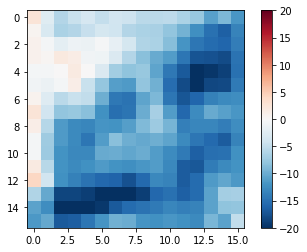

In [84]:
discriminator = Discriminator()
disc_out = discriminator([((inimg+1)*255) , gen_output] ,training = False)
plt.imshow(disc_out[0,...,-1],vmin = -20 , vmax = 20 , cmap = 'RdBu_r')
plt.colorbar()
disc_out.shape

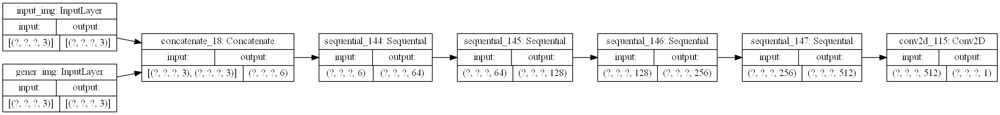

In [85]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=128,rankdir='LR')

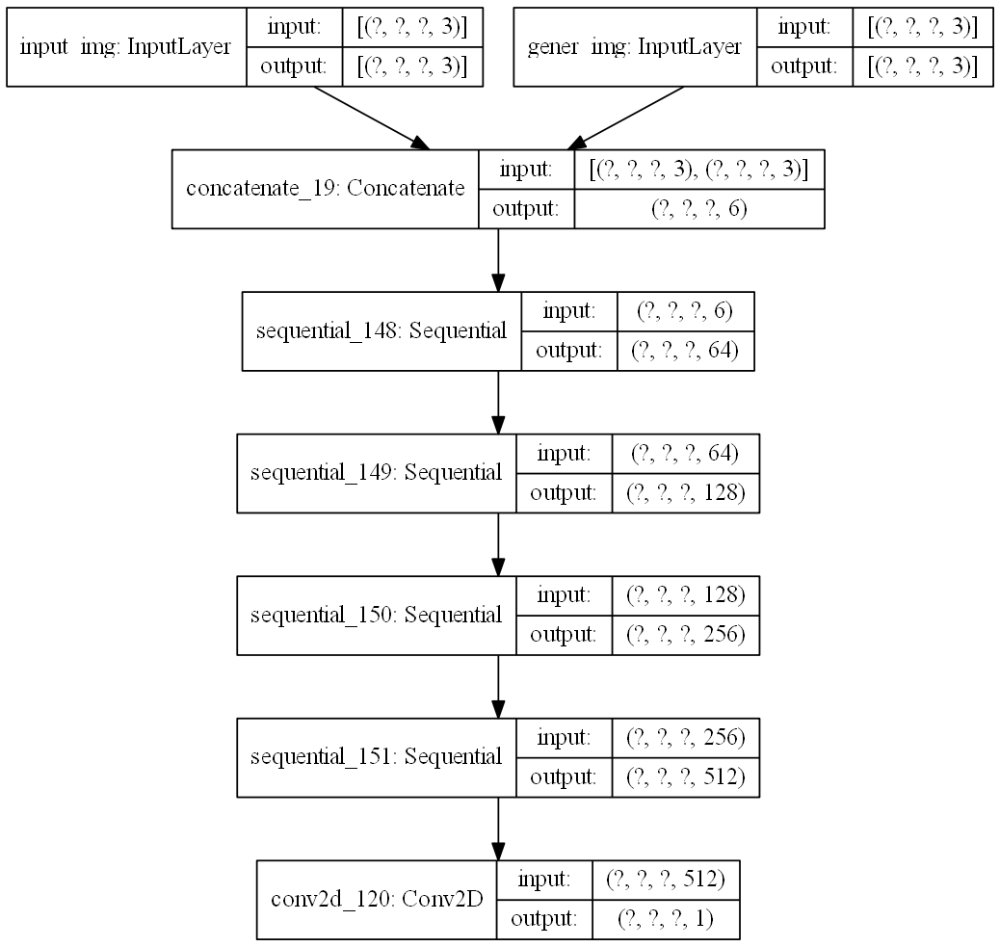

In [86]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=128)

### Resumen de parametros del Discriminador

In [87]:
discriminator = Discriminator()
discriminator.summary()

Model: "model_20"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_img (InputLayer)          [(None, None, None,  0                                            
__________________________________________________________________________________________________
gener_img (InputLayer)          [(None, None, None,  0                                            
__________________________________________________________________________________________________
concatenate_20 (Concatenate)    (None, None, None, 6 0           input_img[0][0]                  
                                                                 gener_img[0][0]                  
__________________________________________________________________________________________________
sequential_152 (Sequential)     (None, None, None, 6 6208        concatenate_20[0][0]      

# Definimos nuestra Funcion de Perdida

$$\begin{aligned}
\mathcal{L}_{c G A N}(G, D)=& \mathbb{E}_{x, y}[\log D(x, y)]+ \mathbb{E}_{x, z}[\log (1-D(x, G(x, z))]
\end{aligned}$$,

$$\mathcal{L}_{L 1}(G)=\mathbb{E}_{x, y, z}\left[\|y-G(x, z)\|_{1}\right]$$,

$$G^{*}=\arg \min _{G} \max _{D} \mathcal{L}_{c G A N}(G, D)+\lambda \mathcal{L}_{L 1}(G)$$,

donde G denota (Generador), D (Discriminador), x (input), y (Target), z (Salida del discriminador) y $\lambda$ un parametro de peso para el error en valor absoluto medio entre la imagen generada y la imagen objetivo.


In [88]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [89]:
def discriminator_loss(disc_real_output, disc_generated_output):
    # Diferencia entre una matriz de 1s del tamano de la salida del discriminador y la salida del discriminador (por ser la real)
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    # Diferencia entre una matriz de 0s y la salida del discriminador (por ser generagos)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    
    total_disc_loss = real_loss + generated_loss
    
    return total_disc_loss

In [90]:
LAMBDA = 100 
def generator_loss(disc_generated_output, gen_output , target):
    #error Adversario
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    # diferencia por pixeles en valor absoluto entre la imagen que queriamos generar y la generada
    #diferencia en valor absoluto medio
    l1_loss = tf.reduce_mean(tf.abs(target-gen_output))
    # 100 veces mas peso al error l1 que al error adversario
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    
    return total_gen_loss

## Especificamos los optimizadores

In [91]:
generator_optimazer = tf.keras.optimizers.Adam(2e-4,beta_1 = 0.5)
discriminator_optimazer = tf.keras.optimizers.Adam(2e-4,beta_1 = 0.5)

### Establecemos check points (puntos de control)


In [92]:
checkpoint_prefix = os.path.join(CKPATH,"ckpt")
checkpoint = tf.train.Checkpoint(generator_optimazer = generator_optimazer,
                                 discriminator_optimazer = discriminator_optimazer,
                                 generator = generator,
                                 discriminator = discriminator)

In [93]:
print(CKPATH)

C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto/checkpoints


#### Definimos una Funcion que nos genere imagenes durante el entrenamiento para ver su evolucion, tomando imagenes y en cada eoch imprimiendo la imagen generada 

In [94]:
def generate_images(model , test_input , tar , save_filename = False, display_imags = True):
    
    prediction = model(test_input,training = True)
    
    if save_filename:
        tf.keras.preprocessing.image.save_img(PATH + '/GeneratedFlowers/' + save_filename + '.jpg', prediction[0,...])#output/
        
    plt.figure(figsize = (10,10))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image','Ground Truth', 'Predicted Image']
    
    if display_imags:
        for i in range(3):
            plt.subplot(1,3,i+1)
            plt.title(title[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
    plt.show()

In [95]:
import datetime
from datetime import time
log_dir="C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto/logs"

summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

### Definimos nuestros pasos de entrenamiento
1. El generador toma el input y obtenemos una imagen de salida 
2. El discriminador observa la imagen de salida del generador y obtenemos la imagen de salida del discriminador
3. El discriminador toma la imagen objetivo (target - imagen esperada) para evaluarla a ver si es real o no
4. Calculamos el valor de perdida para el discriminador
5. Calculamos el valor de perdida para el generador
6. Calculamos los gradientes asociados al generador 
7. Calculamos los gradientes asociados al discriminador
8. Aplicamos la diferenciacion automatica sobre el generador 
9. Aplicamos la diferenciacion automatica sobre el discriminador


In [96]:
@tf.function()
def train_step(input_image,target,e):
    
    with tf.GradientTape() as gen_tape , tf.GradientTape() as discr_tape:
        output_image = generator(input_image, training = True)
        
        output_gen_discr = discriminator([output_image, input_image], training = True )
        output_trg_discr = discriminator([target, input_image], training = True )
        
        discr_loss = discriminator_loss(output_trg_discr, output_gen_discr)
        gen_loss = generator_loss(output_gen_discr , output_image , target)

        generator_grads = gen_tape.gradient(gen_loss , generator.trainable_variables)
        discriminator_grads = discr_tape.gradient(discr_loss , discriminator.trainable_variables)
        
        generator_optimazer.apply_gradients(zip(generator_grads,generator.trainable_variables))
        discriminator_optimazer.apply_gradients(zip(discriminator_grads , discriminator.trainable_variables))
        
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_loss, step = e)
        tf.summary.scalar('disc_loss', discr_loss, step = e)

### Definimos nuestra funcion de entrenamiento que tomara el conjunto de datos y el numero de epocas especificado para aplicar una serie de pasos
por cada epoca:
1. Imprime el paso actual y la epoca actual en la que nos encontramos
2. Ejecuta **train_step** luego, limpia la salida de la celda 
3. Generamos 50 imagenes con el estado actual de la red  para almacenarlas en la ruta especificada
4. Si la epoca alctuales multiplo de 25 crea un chek point (punto de control) 



In [97]:
from IPython.display import clear_output

def train(dataset,epochs):
    for epoch in range(epochs):
        #start = time.time()
        imgi = 0 
        for input_image , target in dataset:
            print('epoch: ' + str(epoch) + '   - train: '  + str(imgi) + '/' + str(len(tr_urls)))
            imgi = imgi + 1 
            train_step(input_image,target,epoch)
            clear_output(wait=True)
        
        imgi = 0
        for inp , tar in test_dataset.take(50):
            generate_images(generator,inp,tar, str(imgi) + '_' + str(epoch),display_imags=True)
            imgi += 1
        if (epoch + 1 ) % 25 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)
#        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))

### Restauramos el ultimo punto de control desde la ruta espesificada para continuar con el entrenamiento

In [98]:
checkpoint.restore(tf.train.latest_checkpoint(CKPATH))

### Generamos las primeras 25 imagenes para validar que la red se restauro correctamente y verificar el estado actualde la red sobre los datos de test

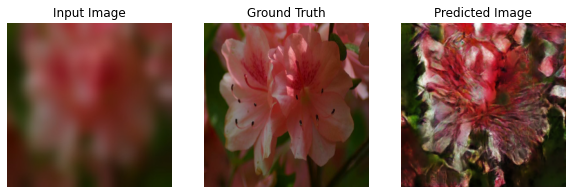

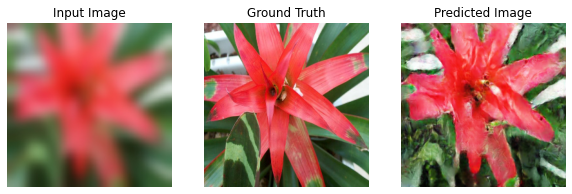

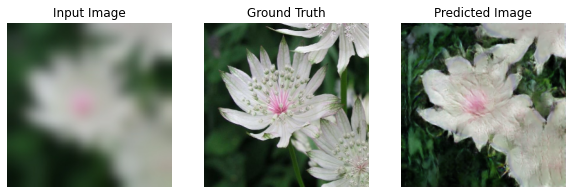

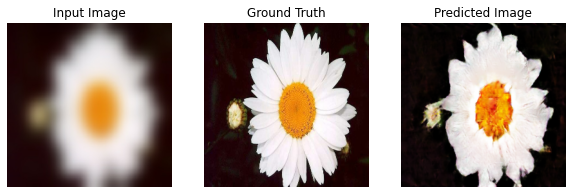

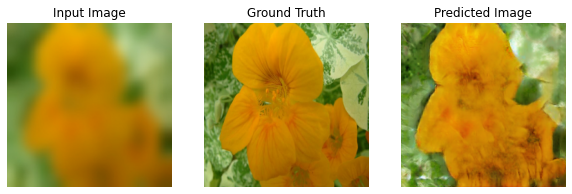

...

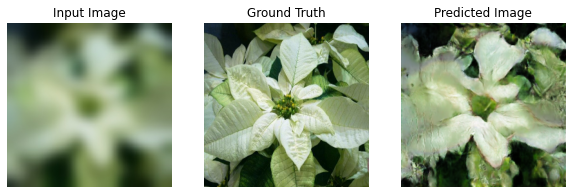

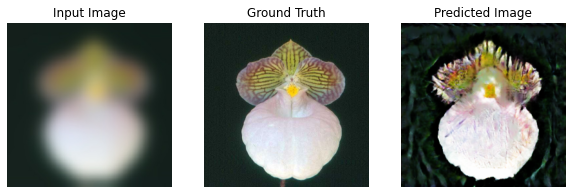

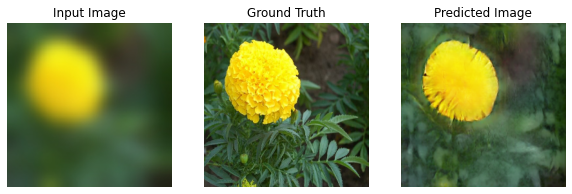

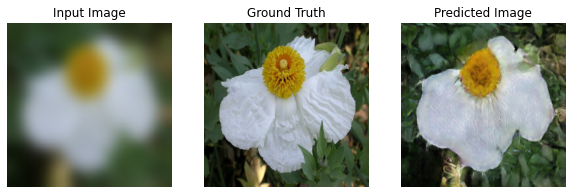

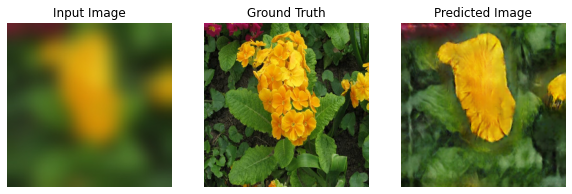

In [99]:
imgi = 0
for inp , tar in test_dataset.take(25):
    generate_images(generator,inp,tar, save_filename = False ,display_imags=True)
    imgi += 1

### Generamos las primeras 25 imagenes para validar que la red se restauro correctamente y verificar el estado actual de la red sobre los datos de entrenamiento

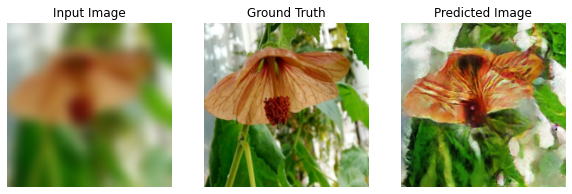

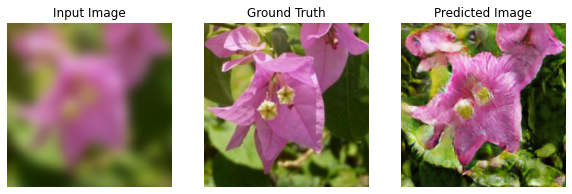

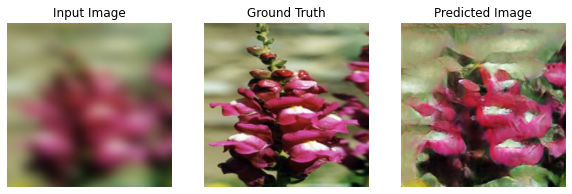

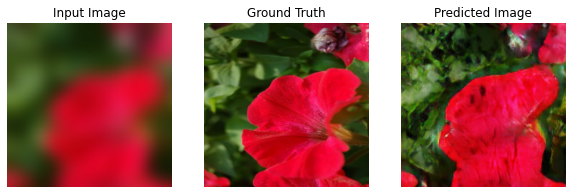

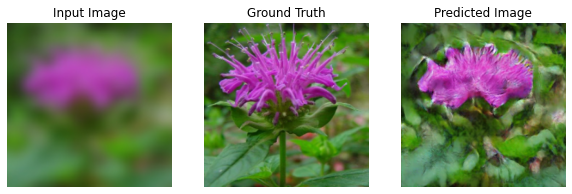

...

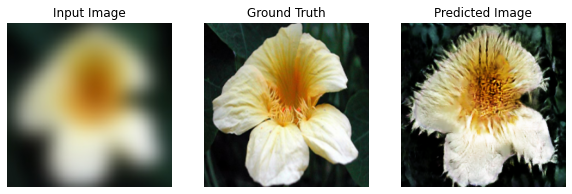

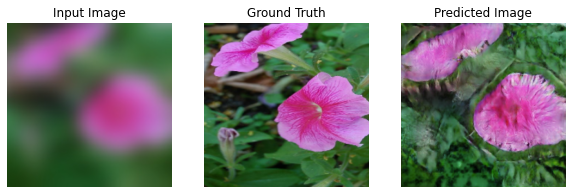

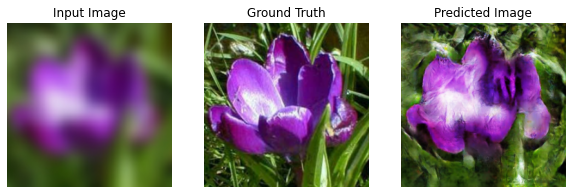

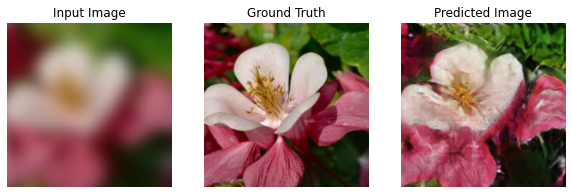

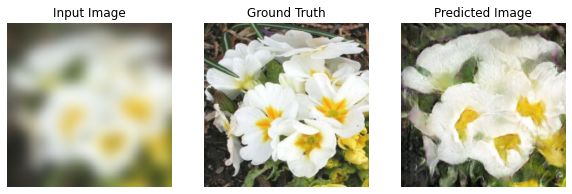

In [100]:
imgi = 0
for inp , tar in train_dataset.take(25):
    generate_images(generator,inp,tar, save_filename = False ,display_imags=True)
    imgi += 1

In [35]:
#%load_ext tensorboard
#%tensorboard --logdir {log_dir}

### Lanzamos el entrenamiento sobre nuestros datos de entrenamiento con el numero de epocas deseado 

In [ ]:
train(train_dataset,250)#750#600#425#250

In [ ]:
#checkpoint.save(file_prefix = checkpoint_prefix)